In [211]:
import json

with open("../data/combined_good_segmentations.json") as f:
    annotations = json.load(f)
    
print(len(annotations['images']))

2215


In [2]:
print(annotations.keys())

dict_keys(['images', 'annotations', 'categories'])


In [3]:
print(annotations['categories'])

[{'supercategory': 'none', 'id': 1, 'name': 'Book / iPad / Puzzle'}, {'supercategory': 'none', 'id': 2, 'name': 'Ball'}, {'supercategory': 'none', 'id': 3, 'name': 'Marker / Crayon'}, {'supercategory': 'none', 'id': 4, 'name': 'Other toy'}, {'supercategory': 'none', 'id': 5, 'name': 'Food'}, {'supercategory': 'none', 'id': 6, 'name': 'Sippy cup / Bottle'}, {'supercategory': 'none', 'id': 7, 'name': 'Utensil'}, {'supercategory': 'none', 'id': 8, 'name': 'Musical instrument'}, {'supercategory': 'none', 'id': 9, 'name': 'Shoe'}, {'supercategory': 'none', 'id': 10, 'name': 'Hand'}]


In [4]:
images = annotations['images']
all_bboxes = annotations['annotations']
categories = annotations['categories']

def get_bboxes(image_id, all_bboxes):
    bboxes = []
    for bbox in all_bboxes:
        if bbox['image_id'] == image_id:
            bboxes.append(bbox)
    return bboxes

def get_category_bboxes(category_id, all_bboxes):
    bboxes = []
    for bbox in all_bboxes:
        if bbox['category_id'] == category_id:
            bboxes.append(bbox)
    return bboxes

print(get_bboxes(1, all_bboxes))

for i in range(1, 11):
    print(categories[i-1]['name'], ':', len(get_category_bboxes(i, all_bboxes)))

[{'segmentation': [[458.0, 441.5, 493.5, 427.0, 491.5, 417.0, 487.5, 409.0, 497.5, 387.0, 497.5, 375.0, 470.0, 362.5, 463.5, 358.0, 463.5, 348.0, 456.5, 326.0, 453.5, 307.0, 453.5, 297.0, 450.5, 288.0, 449.5, 277.0, 424.0, 238.5, 420.0, 237.5, 413.0, 240.5, 405.0, 240.5, 404.5, 242.0, 407.5, 247.0, 407.5, 253.0, 409.5, 258.0, 411.5, 258.0, 410.5, 261.0, 415.0, 269.5, 414.5, 266.0, 416.5, 267.0, 427.5, 289.0, 434.5, 307.0, 433.5, 309.0, 435.5, 310.0, 438.5, 320.0, 447.5, 338.0, 463.5, 385.0, 465.0, 387.5, 466.0, 379.5, 476.5, 403.0, 476.5, 412.0, 474.5, 416.0, 477.5, 421.0, 476.5, 426.0, 456.5, 441.0], [], [], [106.0, 478.5, 104.5, 459.0, 91.5, 380.0, 91.5, 377.0, 96.5, 374.0, 80.5, 357.0, 137.0, 344.5, 148.0, 338.5, 153.5, 333.0, 152.5, 320.0, 162.5, 312.0, 158.5, 299.0, 149.5, 290.0, 152.0, 290.5, 152.5, 289.0, 149.0, 282.5, 132.0, 278.5, 110.0, 266.5, 94.0, 267.5, 92.5, 266.0, 92.0, 258.5, 26.0, 257.5, 20.0, 260.5, 14.0, 260.5, 14.0, 262.5, 2.5, 267.0, 6.5, 428.0, 8.0, 428.5, 72.0, 3

609
{'supercategory': 'none', 'id': 1, 'name': 'Book / iPad / Puzzle'}


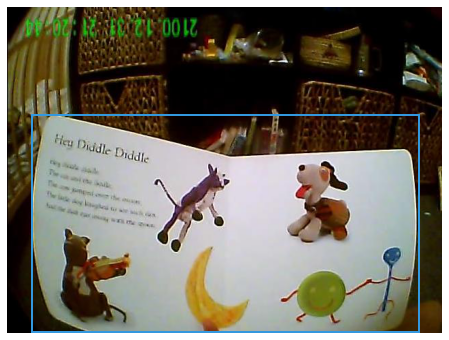

In [5]:
import random
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
%matplotlib inline

def get_cmap(n, name='hsv'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

colors = np.random.random((10, 3))
image_id = random.randrange(0, len(images))
print(image_id)
bboxes = get_bboxes(image_id, all_bboxes)
plt.figure(figsize=(20, 6))
ax = plt.gca()
url = images[image_id-1]['file_name']
image = io.imread(url)
plt.imshow(image)

for i, bbox in enumerate(bboxes):
    category = categories[bbox['category_id']-1]
    print(category)
    bbox = bbox['bbox']
    rect = Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=colors[i], facecolor='none')
    ax.add_patch(rect)
plt.axis('off')
plt.show()

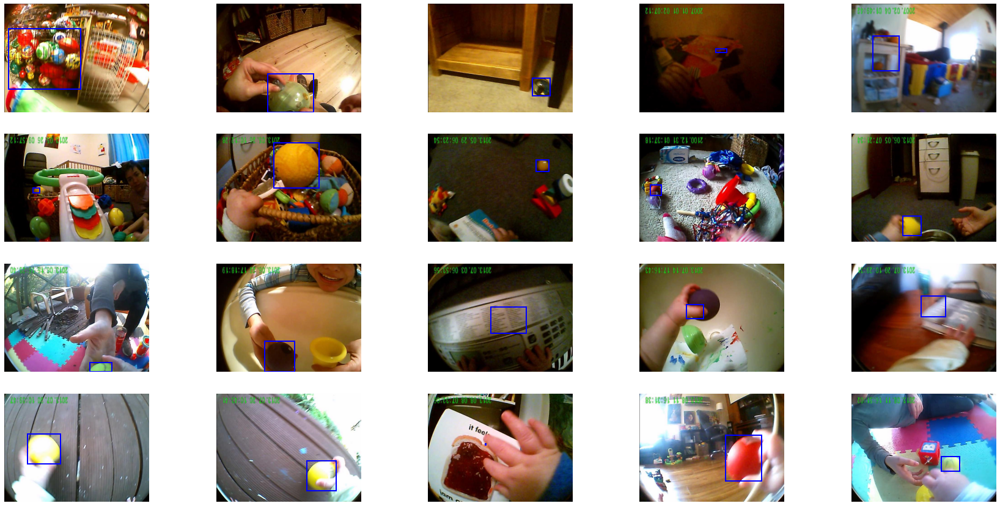

In [154]:
ball_bboxes = get_category_bboxes(2, all_bboxes)
plt.figure(figsize=(30, 15))
for i, ball_bbox in enumerate(ball_bboxes[20:40]):
    # get corresponding image
    image_id = ball_bbox['image_id']
    url = images[image_id-1]['file_name']
    image = io.imread(url)
    plt.subplot(4, 5, i+1)
    ax = plt.gca()
    plt.imshow(image)
    
    bbox = ball_bbox['bbox']
    rect = Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='blue', facecolor='none')
    ax.add_patch(rect)

    plt.axis('off')

plt.show()

In [289]:
# load model
import argparse
import os
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
# from pytorch_lightning.callbacks import ModelCheckpoint

from PIL import Image
from torchvision import transforms
from multimodal.multimodal_data_module import EVAL_DATA_DIR, SOS_TOKEN_ID, EOS_TOKEN_ID, IMAGE_H, IMAGE_W, read_vocab
from multimodal.multimodal_saycam_data_module import MultiModalSAYCamDataModule, EXTRACTED_FRAMES_DIRNAME
from multimodal.coco_captions_data_module import COCOCaptionsDataModule
# from multimodal.multimodal import MultiModalModel
from multimodal.multimodal_lit import MultiModalLitModel
from multimodal.attention_maps import gradCAM, getAttMap, n_inv, imshow
from train import _setup_parser

%matplotlib inline
%load_ext autoreload
%autoreload 2

EVAL_FRAMES_DIRNAME = EVAL_DATA_DIR / "eval"

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

checkpoints = [
    "../checkpoints/multimodal_text_encoder_lstm_lr_5e-05_weight_decay_0.1_fix_temperature_True_batch_size_8",
    # "../checkpoints/multimodal_text_encoder_embedding_lr_0.0001_weight_decay_0.1_fix_temperature_True_batch_size_16"
]

checkpoint = Path(checkpoints[-1])
if checkpoint.is_dir():
    checkpoint = list(checkpoint.glob("epoch=*.ckpt"))[0]
print("loading model from", checkpoint)
model = MultiModalLitModel.load_from_checkpoint(checkpoint, map_location=device)
model.eval()
print(model.hparams["args"])

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
loading model from ../checkpoints/multimodal_text_encoder_lstm_lr_5e-05_weight_decay_0.1_fix_temperature_True_batch_size_8/epoch=199.ckpt
Namespace(accelerator=None, accumulate_grad_batches=1, amp_backend='native', amp_level='O2', augment_frames=True, auto_lr_find=False, auto_scale_batch_size=False, auto_select_gpus=False, batch_size=8, benchmark=False, bias=True, bidirectional=False, check_val_every_n_epoch=1, checkpoint_callback=True, crange=1, default_root_dir=None, deterministic=False, devices=None, distributed_backend=None, dropout_i=0.0, dropout_o=0.0, embedding_dim=512, embedding_type='flat', exp_name='multimodal_text_encoder_lstm_lr_5e-05_weight_decay_0.1_fix_temperature_True_batch_size_8', fast_dev_run=False, finetune_cnn=False, fix_temperature=True, flush_logs_every_n_steps=100, gpus=1, gradient_clip_algorithm='norm', gradient_clip_val=0.0, ipus=None, lambda_lm=0.0, lambda_mm=1.0, limit_pr

0.4666666666666667
0.35
[397.5, 278.5, 83.0, 65.0]
[89.77499999999999, 18.9, 69.3, 93.8]


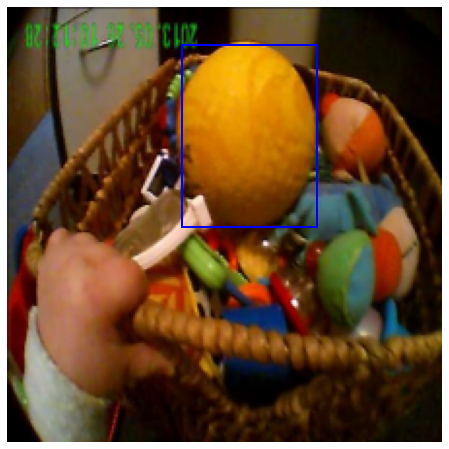

In [198]:
# resize image and bounding box
import copy
from skimage.transform import rescale, resize

idx = 26
image_id = ball_bboxes[idx]['image_id']
url = images[image_id-1]['file_name']
I = io.imread(url)
img_size = 224
img_height = I.shape[0]
img_width = I.shape[1]
img_height_ratio = img_size / img_height
img_width_ratio = img_size / img_width
print(img_height_ratio)
print(img_width_ratio)

I_resized = resize(I, (img_size, img_size), anti_aliasing=True)

# load and display instance annotations
plt.figure(figsize=(8, 8))
ax = plt.gca()
plt.imshow(I_resized); plt.axis('off')
gt_bbox = copy.deepcopy(ball_bboxes[idx]['bbox'])
print(bbox)
gt_bbox[0] = gt_bbox[0] * img_width_ratio
gt_bbox[1] = gt_bbox[1] * img_height_ratio
gt_bbox[2] = gt_bbox[2] * img_width_ratio
gt_bbox[3] = gt_bbox[3] * img_height_ratio
print(gt_bbox)
rect = Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2], gt_bbox[3], linewidth=2, edgecolor='blue', facecolor='none')
ax.add_patch(rect)


In [199]:
# get data module for transform
# parse empty args
parser = _setup_parser()
args = parser.parse_args("")
# set args
for key, value in model.args.items():
    setattr(args, key, value)
# make the train dataloader deterministic
args.augment_frames = False

# build data module
dataset_name = getattr(args, "dataset", "coco")
DataModuleClass = {
    "saycam": MultiModalSAYCamDataModule,
    "coco": COCOCaptionsDataModule,
}["saycam"]
data = DataModuleClass(args)
data.prepare_data()
data.setup()
saycam_dm = MultiModalSAYCamDataModule()

/home/wv9/code/WaiKeen/miniconda3/envs/multimodal-baby/lib/python3.8/site-packages/pytorch_lightning/core/datamodule.py:73: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  rank_zero_deprecation(


Calling prepare_data!
SAYCam transcripts have already been downloaded. Skipping this step.
Transcripts have already been renamed. Skipping this step.
Transcripts have already been preprocessed. Skipping this step.
Training frames have already been extracted. Skipping this step.
Training metadata files have already been created . Skipping this step.
Evaluation frames have already been extracted. Skipping this step.
Evaluation metadata files have already been created . Skipping this step.
Vocabulary file already exists. Skipping this step.
Calling setup!


In [301]:
# encode image
saycam_transform = saycam_dm.base_transform
img_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.CenterCrop(224),
    # transforms.Resize((img_size, img_size)),
    saycam_transform
])

def encode_image(img):
    img = img_transform(img).unsqueeze(0).to(device)
    img_embedding, _ = model.model.encode_image(img)
    return img

def invert_image(img):
    new_n_inv = transforms.Compose([
        transforms.Normalize(
        [-0.485/0.229, -0.456/0.224, -0.406/0.225], [1/0.229, 1/0.224, 1/0.225]),
    ])  
    # TODO
    pass

# encode image
img = encode_image(I)

# encode label
DATA_DIR = Path("/misc/vlgscratch4/LakeGroup/shared_data/S_multimodal")
VOCAB_FILENAME = DATA_DIR / "vocab.json"
vocab = read_vocab(VOCAB_FILENAME)
label = torch.LongTensor([SOS_TOKEN_ID, vocab["ball"], EOS_TOKEN_ID])
# label = torch.LongTensor([vocab["ball"]])
label_len = torch.LongTensor([3]).squeeze()

def encode_text(label, label_len):
    return model.model.encode_text(label.unsqueeze(0).to(device), label_len.unsqueeze(0).to(device))[0]

text_embedding = encode_text(label, label_len)
print(text_embedding.size())

print(img_transform)

torch.Size([1, 512])
Compose(
    ToPILImage()
    CenterCrop(size=(224, 224))
    Compose(
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)
)


normalizing: [vmin, vmax] = [-0.000486, 0.008252] to [0, 1]


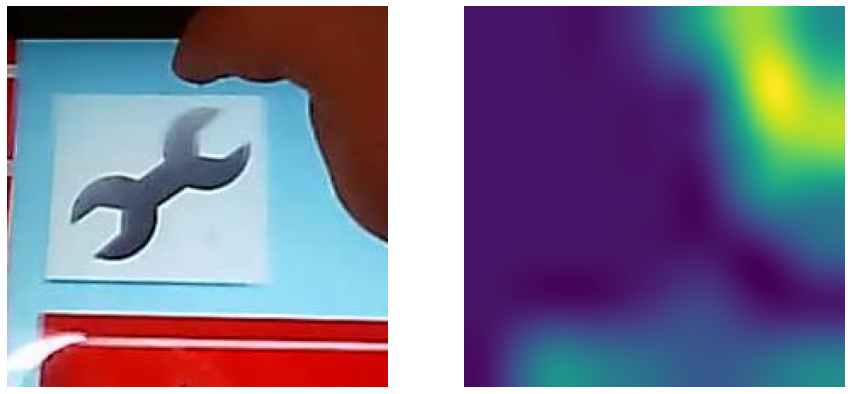

In [302]:
from scipy.ndimage import filters

def normalize(x: np.ndarray, vmin=None, vmax=None) -> np.ndarray:
    """Normalize to [0, 1].
    """
    if vmin is None:
        vmin = x.min()
    if vmax is None:
        vmax = x.max()
    print(f"normalizing: [vmin, vmax] = [{vmin:.6f}, {vmax:.6f}] to [0, 1]")
    x = x - vmin
    vmax = vmax - vmin
    if vmax > 0:
        x = x / vmax
    return x

def getRawAttMap(img, attn_map, interpolation='cubic', blur=True,
                 vmin=None, vmax=None, cmap='viridis'):
    """Returns raw attention map"""
    if attn_map.shape != img.shape[:2]:
        import cv2
        attn_map = cv2.resize(
            attn_map, img.shape[1::-1],
            interpolation=getattr(cv2, "INTER_" + interpolation.upper()))
    if blur:
        attn_map = filters.gaussian_filter(attn_map, 0.02*max(img.shape[:2]))
    attn_map = normalize(attn_map, vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap(cmap)
    attn_map_c = np.delete(cmap(attn_map), 3, 2)
    return attn_map_c, attn_map

def show_heatmap(ax, np_img: np.ndarray, img: torch.Tensor, text_features: torch.Tensor, normalize=False, vmin=None, vmax=None):
    saliency_layer = "layer4"

    attn_map = gradCAM(
        model.vision_encoder.model,
        img,
        text_features,
        getattr(model.vision_encoder.model, saliency_layer),
        normalize_features=model.model.normalize_features,
    )
    attn_map = attn_map.squeeze()

    attn_map = attn_map.detach().cpu().numpy()
    attn_map_c, attn_map = getRawAttMap(np_img, attn_map, vmin=vmin, vmax=vmax)
    imshow(ax, attn_map_c)
    return attn_map

new_n_inv = transforms.Compose([
    transforms.Normalize(
    [-0.485/0.229, -0.456/0.224, -0.406/0.225], [1/0.229, 1/0.224, 1/0.225]),
])
    
plt.figure(figsize=(15, 10))
ax = plt.subplot(1, 2, 1)
plt.imshow(new_n_inv(img.squeeze()).permute((1, 2, 0)).cpu().numpy())
ax.axis('off')
ax = plt.subplot(1, 2, 2)
attn_map = show_heatmap(ax, new_n_inv(img.squeeze()).permute((1, 2, 0)).cpu().numpy(), img, text_embedding)

(-0.5, 223.5, 223.5, -0.5)

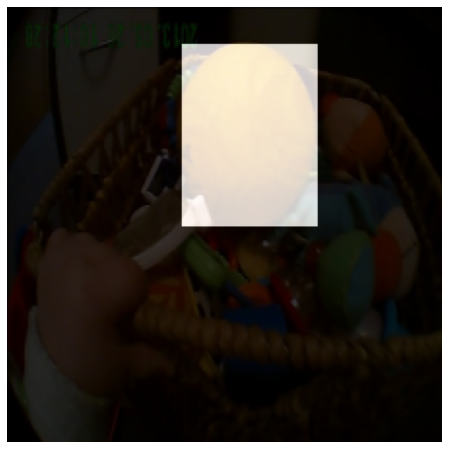

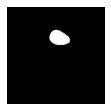

In [202]:
def get_bbox_mask(bbox):
    img_size = 224
    mask = np.zeros((img_size, img_size))
    for i in range(img_size):
        for j in range(img_size):
            if j >= bbox[0] and j <= bbox[0] + bbox[2] and i >= bbox[1] and i <= bbox[1] + bbox[3]:
                mask[i][j] = 1
    return mask

mask = get_bbox_mask(gt_bbox)
plt.figure(figsize=(8, 8))
plt.imshow(I_resized)
plt.imshow(mask, cmap='gray', alpha=0.8)
plt.axis('off')

# create bounding box from attention map
def get_attn_mask(attn_map, threshold):
    img_size = 224
    mask = np.zeros((img_size, img_size))
    mask = (attn_map > threshold)
    return mask

attn_mask = get_attn_mask(attn_map, 0.5)

plt.figure(figsize=(8, 8))
plt.subplot(1, 4, 1)
plt.imshow(get_attn_mask(attn_map, 0.8), cmap='gray')
plt.axis('off')  

[[    0     0   224   224 48891]
 [   67    94    37    28   770]
 [   60   166    30    22   515]]
Rectangle(xy=(9.625, 148.167), width=18.9, height=35.4667, angle=0)


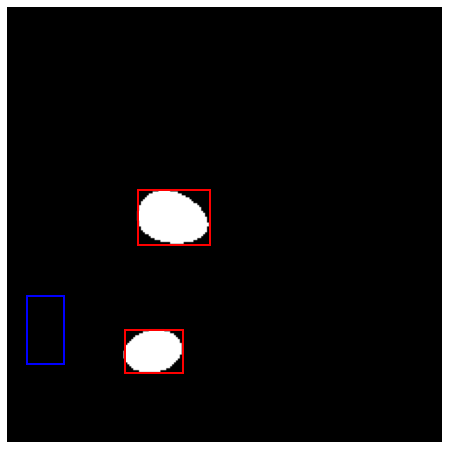

0.0


Text(0, 0.5, 'IoU')

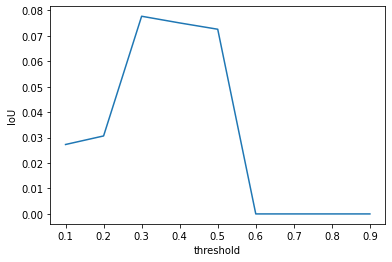

In [292]:
import cv2
from matplotlib.patches import Rectangle

def get_pred_bboxes(attn_map, threshold):
    mask = get_attn_mask(attn_map, threshold).astype(np.uint8)
    connectivity = 8
    output = cv2.connectedComponentsWithStats(mask, connectivity, cv2.CV_32S)
    pred_bboxes = output[2]  # output: (N, labels, bboxes)
    return pred_bboxes, mask

def get_largest_bbox(bboxes):
    bboxes = bboxes[1:]  # ignore first entry
    bbox_size = [bbox[4] for bbox in bboxes]
    bbox_max_idx = bbox_size.index(max(bbox_size))
    return bboxes[bbox_max_idx][:4]  # drop size

threshold = 0.8
pred_bboxes, mask = get_pred_bboxes(attn_map, threshold)
print(pred_bboxes)

def plot_mask_with_pred_bboxes(mask, pred_bboxes):
    plt.figure(figsize=(8, 8))
    ax = plt.gca()
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    for bbox_idx in range(1, len(pred_bboxes)):
        bbox = pred_bboxes[bbox_idx]
        rect = Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    rect = Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2], gt_bbox[3], linewidth=2, edgecolor='b', facecolor='none')
    print(rect)
    ax.add_patch(rect)

    plt.show()
    
plot_mask_with_pred_bboxes(mask, pred_bboxes)

import torchvision.ops.boxes as bops

def calculate_iou(gt_bbox, pred_bboxes):
    pred_bbox = copy.deepcopy(get_largest_bbox(pred_bboxes))
    
    # convert width/height to x2/y2
    pred_bbox[2] = pred_bbox[0] + pred_bbox[2]
    pred_bbox[3] = pred_bbox[1] + pred_bbox[3]

    # convert ground truth bbox
    gt_bbox_copy = copy.deepcopy(gt_bbox)
    gt_bbox_copy[2] = gt_bbox_copy[0] + gt_bbox_copy[2]
    gt_bbox_copy[3] = gt_bbox_copy[1] + gt_bbox_copy[3]
    
    # convert to tensor and add batch dim
    pred_bbox_tensor = torch.tensor(pred_bbox, dtype=torch.float).unsqueeze(0)
    gt_bbox_tensor = torch.tensor(gt_bbox_copy, dtype=torch.float).unsqueeze(0)

    iou = bops.box_iou(gt_bbox_tensor, pred_bbox_tensor).squeeze().item()
    return iou

print(calculate_iou(gt_bbox, bboxes))

def sweep_iou(attn_map, gt_bbox):
    ious = []
    thresholds = np.linspace(0.1, 0.9, 9)
    for threshold in thresholds:
        pred_bboxes, mask = get_pred_bboxes(attn_map, threshold)
        pred_bbox = get_largest_bbox(pred_bboxes)
        iou = calculate_iou(gt_bbox, pred_bboxes)
        ious.append(iou)
    return ious

plt.plot(np.linspace(0.1, 0.9, 9), sweep_iou(attn_map, gt_bbox))
plt.xlabel("threshold")
plt.ylabel("IoU")

120 74
[89.77499999999999, 18.9, 69.3, 93.8]
True
normalizing: [vmin, vmax] = [-0.000807, 0.012799] to [0, 1]


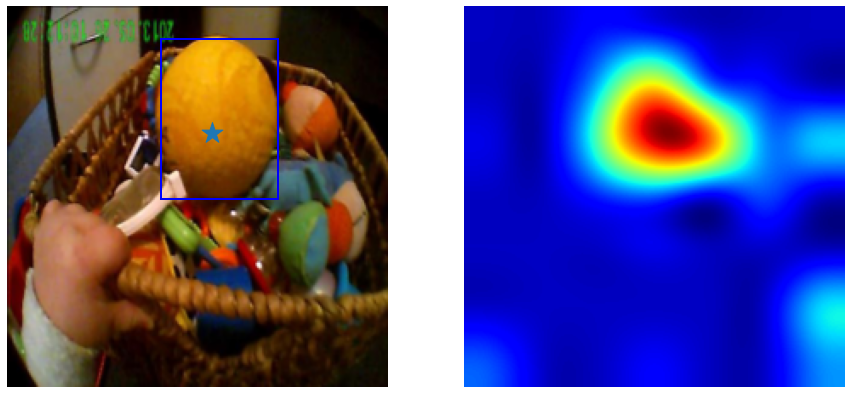

In [212]:
# pointing game
def check_max_attn(attn_map, gt_bbox):
    """Pointing game metric: check if max attention is inside ground truth bbox"""
    ymax, xmax = np.where(attn_map == attn_map.max())
    xmax = xmax[0]
    ymax = ymax[0]
    if gt_bbox[0] <= xmax and xmax <= gt_bbox[0] + gt_bbox[2] and gt_bbox[1] <= ymax and ymax <= gt_bbox[1] + gt_bbox[3]:
        return True
    else:
        return False

ymax, xmax = np.where(attn_map==attn_map.max())
print(xmax[0], ymax[0])
print(gt_bbox)

print(check_max_attn(attn_map, gt_bbox))

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
ax = plt.gca()
plt.imshow(new_n_inv(img.squeeze()).permute((1, 2, 0)).cpu().numpy())
plt.axis('off')
plt.scatter(xmax, ymax, s=480, marker='*')
rect = Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2], gt_bbox[3], linewidth=2, edgecolor='b', facecolor='none')
ax.add_patch(rect)
ax = plt.subplot(1, 2, 2)
attn_map = show_heatmap(ax, new_n_inv(img.squeeze()).permute((1, 2, 0)).cpu().numpy(), img, text_embedding)

http://langcog.stanford.edu/expts/saycam/frames/12735-S_20130526_0709_02.AVI.mp4-10130.jpg
normalizing: [vmin, vmax] = [-0.000532, 0.003431] to [0, 1]
normalizing: [vmin, vmax] = [-0.000440, 0.003221] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/12943-S_20130602_0716_08.mp4-4355.jpg
normalizing: [vmin, vmax] = [-0.000391, 0.008566] to [0, 1]
normalizing: [vmin, vmax] = [-0.000316, 0.008464] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/13098-S_20130612_0726_02.AVI.mp4-9120.jpg
normalizing: [vmin, vmax] = [-0.000419, 0.003432] to [0, 1]
normalizing: [vmin, vmax] = [-0.000354, 0.003265] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/13705-S_20130714_0827_08.AVI.mp4-9150.jpg
normalizing: [vmin, vmax] = [-0.000573, 0.005411] to [0, 1]
normalizing: [vmin, vmax] = [-0.000535, 0.005360] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/14245-S_20130814_0928_02.AVI.mp4-2515.jpg
normalizing: [vmin, vmax] = [-0.000508, 0.005612] to [0, 1]
normalizing: 

/tmp/ipykernel_215739/1803942188.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=((12, 4)))


normalizing: [vmin, vmax] = [-0.000351, 0.005469] to [0, 1]
normalizing: [vmin, vmax] = [-0.000324, 0.005185] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/13326-S_20130622_0805_05.AVI.mp4-13775.jpg
normalizing: [vmin, vmax] = [-0.000453, 0.009036] to [0, 1]
normalizing: [vmin, vmax] = [-0.000379, 0.008948] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/13495-S_20130703_0816_06.AVI.mp4-3625.jpg
normalizing: [vmin, vmax] = [-0.000538, 0.005170] to [0, 1]
normalizing: [vmin, vmax] = [-0.000470, 0.004998] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/13672-S_20130714_0827_05.AVI.mp4-12175.jpg
normalizing: [vmin, vmax] = [-0.000602, 0.006106] to [0, 1]
normalizing: [vmin, vmax] = [-0.000482, 0.005984] to [0, 1]
http://langcog.stanford.edu/expts/saycam/frames/13800-S_20130720_0903_04.AVI.mp4-15025.jpg
normalizing: [vmin, vmax] = [-0.001118, 0.013194] to [0, 1]
normalizing: [vmin, vmax] = [-0.000947, 0.013053] to [0, 1]
http://langcog.stanford.edu/expts/say

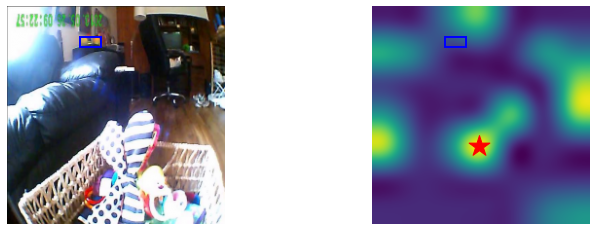

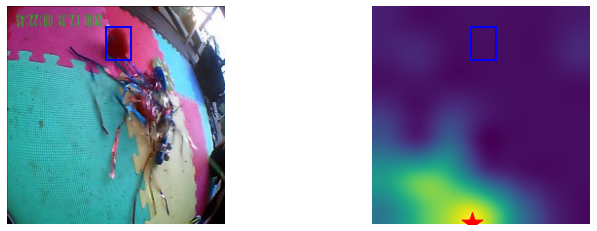

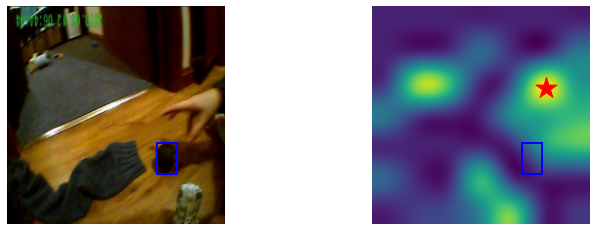

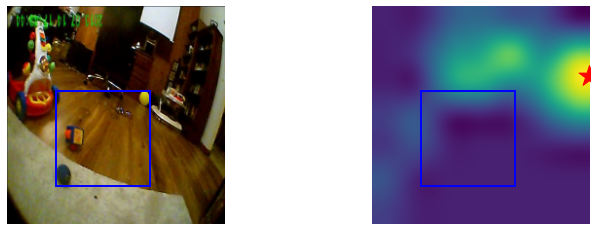

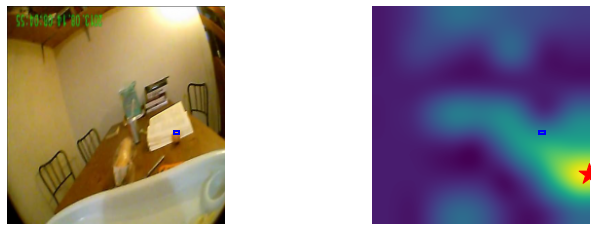

...

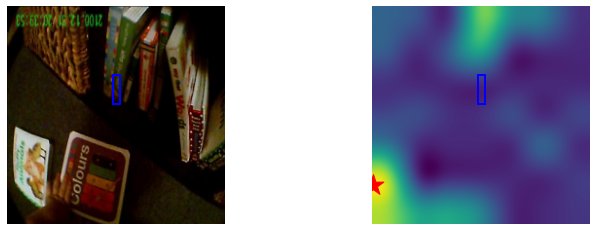

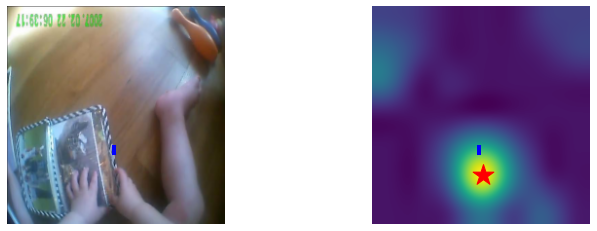

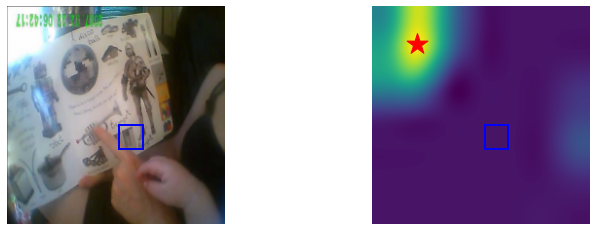

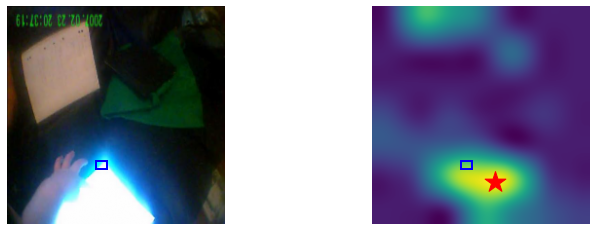

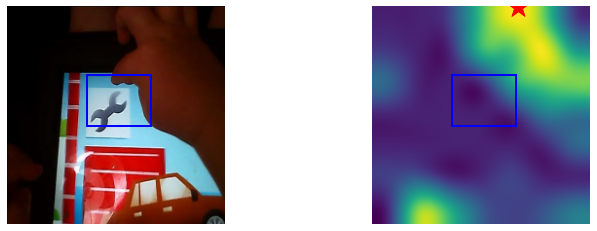

In [303]:
# get chance area
ball_bboxes = get_category_bboxes(2, all_bboxes)
ball_bboxes_size = []
correct = []
ious = []
saliency_layer = "layer4"

for idx, ball_bbox in enumerate(ball_bboxes):
    # get corresponding image
    image_id = ball_bbox['image_id']
    url = images[image_id-1]['file_name']

    if 'S_' not in url:
        continue
    
    print(url)
    I = io.imread(url)
    
    img_size = 224
    img_height = I.shape[0]
    img_width = I.shape[1]
    img_height_ratio = img_size / img_height
    img_width_ratio = img_size / img_width

    # resize image
    I_resized = resize(I, (img_size, img_size), anti_aliasing=True)

    # load and display instance annotations
    gt_bbox = copy.deepcopy(ball_bbox['bbox'])
    gt_bbox[0] = gt_bbox[0] * img_width_ratio
    gt_bbox[1] = gt_bbox[1] * img_height_ratio
    gt_bbox[2] = gt_bbox[2] * img_width_ratio
    gt_bbox[3] = gt_bbox[3] * img_height_ratio

    bbox_size = gt_bbox[2] * gt_bbox[3]
    ball_bboxes_size.append(bbox_size)
    
    # encode image
    img = encode_image(I)
    
    # encode label
    label = torch.LongTensor([vocab["ball"]])
    label_len = torch.LongTensor([1]).squeeze()
    text_embedding = encode_text(label, label_len)
    
    # get attention map
    attn_map = gradCAM(
        model.vision_encoder.model,
        img,
        text_embedding,
        getattr(model.vision_encoder.model, saliency_layer),
        normalize_features=model.model.normalize_features,
    )
    attn_map = attn_map.squeeze().detach().cpu().numpy()
    
    # check if max attention is correct
    correct.append(check_max_attn(attn_map, gt_bbox))
    
    # iou
    iou = sweep_iou(normalize(attn_map), gt_bbox)
    ious.append(iou)
    
    # plot image + attention map
    attn_map_c, attn_map = getRawAttMap(I_resized, attn_map)
    plt.figure(figsize=((12, 4)))
    
    # plot image + ground truth bbox
    ax = plt.subplot(1, 2, 1)
    plt.imshow(I_resized)
    rect = Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2], gt_bbox[3], linewidth=2, edgecolor='b', facecolor='none')
    ax.add_patch(rect)
    plt.axis('off')

    # plot attention map + max attention
    ax = plt.subplot(1, 2, 2)
    imshow(ax, attn_map_c)
    ymax, xmax = np.where(attn_map == attn_map.max())
    xmax = xmax[0]
    ymax = ymax[0]
    plt.scatter(xmax, ymax, s=480, marker='*', c='red')
    rect = Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2], gt_bbox[3], linewidth=2, edgecolor='b', facecolor='none')
    ax.add_patch(rect)


In [294]:
print(np.mean(ball_bboxes_size) / (224 * 224))
print(np.mean(correct))
print(len(correct))

0.053819875280841506
0.0392156862745098
51


Text(0, 0.5, 'IoU')

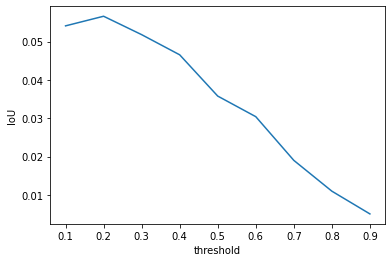

In [295]:
ious_np = np.array(ious)
plt.plot(np.linspace(0.1, 0.9, 9), np.mean(ious_np, axis=0))
plt.xlabel("threshold")
plt.ylabel("IoU")